In [26]:
# Standard library imports
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Colormap
from typing import Dict, Union, Tuple, List, Optional, Callable
from collections import defaultdict
from functools import partial
# Third-party imports
import xarray as xr
from weatherbenchX import aggregation

# Class approach
---

In [ ]:
# scoring_analysis.py
# This module provides classes and functions to load, aggregate, and plot
# statistical scores from NetCDF files in a specified directory.

class StatsLoader:
    def __init__(self, exp_path: os.PathLike):
        self.name: str = os.path.basename(exp_path)
        self.stats_dir: os.PathLike = self._get_stats_dir(exp_path)

    def __repr__(self) -> str:
        return f"ExpStats(name={self.name}, stats_dir={self.stats_dir})"

    def __str__(self) -> str:
        return f"Experiment: {self.name}, Statistics Directory: {self.stats_dir}"
    
    @staticmethod
    def _get_stats_dir(exp_path: os.PathLike) -> os.PathLike:
        """
        Returns the path to the statistics directory.

        Returns:
            os.PathLike: Path to the statistics directory.
        """
        return os.path.expanduser(os.path.join(exp_path, "statistics"))

    @property
    def score_names(self) -> set:
        """
        Returns a set of unique score names from the statistics directory.

        Returns:
            set: Unique score names.
        """
        return self._get_scores_and_variable_names(self.stats_dir)[0]

    @property
    def variable_names(self) -> set:
        """
        Returns a set of unique variable names from the statistics directory.

        Returns:
            set: Unique variable names.
        """
        return self._get_scores_and_variable_names(self.stats_dir)[1]
    
    @staticmethod
    def _get_scores_and_variable_names(stats_dir: os.PathLike) -> Tuple[set, set]:
        """
        Get unique score names and variable names from the statistics directory.

        Args:
            stats_dir (str): Path to the directory containing statistics files.

        Returns:
            tuple: (set of score names, set of variable names)
        """
        scores = set()
        variables = set()
        expanded_path = os.path.expanduser(stats_dir)
        for filename in os.listdir(expanded_path):
            if "_" in filename:
                score, var = filename.split('_', 1)
                var = var.replace('.nc', '')
                scores.add(score)
                variables.add(var)
        
        return scores, variables

    def load_statistics(self) -> Dict[str, Dict[str, xr.Dataset]]:
        """
        Loads score NetCDF files from a directory and organizes the datasets
        into a nested dictionary: {score_name: {variable_name: Dataset}}.

        Parameters:
            stats_dir (str): Path to the directory containing the .nc score files.

        Returns:
            dict[str, dict[str, xarray.Dataset]]
        """
        statistics = defaultdict(dict)

        for filename in os.listdir(self.stats_dir):
            if filename.endswith(".nc"):
                name = filename.replace('.nc', '')  # Remove ".nc"
                # split into score and variable names
                score_name, variable_name = name.split('_', 1) 
                # Store current path
                filepath = os.path.join(self.stats_dir, filename)
                # Add the dataarray to the nested dictionary
                statistics[score_name][variable_name] = xr.load_dataarray(filepath)

        return dict(statistics)

class StatsAggSession:
    def __init__(self, exp_stats: StatsLoader):
        self.exp_stats = exp_stats

    def __enter__(self):
        self.exp_name = self.exp_stats.name
        self.score_names = self.exp_stats.score_names
        self.variable_names = self.exp_stats.variable_names
        self._load_stats_fn = self.exp_stats.load_statistics
        return self

    def __exit__(self, exc_type, exc_value, exc_traceback):
        self.__dict__.clear() # Clear all attributes to free memory
        import gc; gc.collect() # Force garbage collection to free memory

    def __repr__(self) -> str:
        return f"StatsAggSession(exp_name={self.exp_name}, score_names={self.score_names}, variable_names={self.variable_names})"   

    def __str__(self) -> str:
        return f"Stats. Aggregation Session for Experiment: {self.exp_name}, Scores: {self.score_names}, Variables: {self.variable_names}"
    
    def agg_scores(
        self, 
        reduce_dims: List[str],
        ) -> Dict[str, Dict[str, xr.Dataset]]:
        """
        Aggregates the experiment statistics by reducing the specified dimensions.

        Args:
            reduce_dims (List[str]): List of dimension names to reduce (e.g., ["init_time", "latitude"]).

        Returns:
            Dict[str, Dict[str, xr.Dataset]]: Aggregated datasets grouped by score and variable.
        """
        aggregator = aggregation.Aggregator(reduce_dims=reduce_dims, skipna=True)
        aggregation_state = aggregator.aggregate_statistics(self._load_stats_fn())
        return aggregation_state.mean_statistics()

def plot_lead_time_scores(
    exp_name: str,
    score_names: Union[set, List], 
    variable_names: Union[set, List], 
    lead_time_scores: Dict[str, Dict[str, xr.Dataset]],
    axs: plt.Axes, 
    ) -> plt.Axes:
    """
    Plots the lead time scores for a given score and variable.

    Args:
        score_name (str): The name of the score to plot.
        variable_name (str): The name of the variable to plot.
    """

    # Number of axes must be a higher than the number of scores
    axs_f = axs.flatten() if hasattr(axs, 'flatten') else axs
    if len(score_names) > len(axs_f):
        raise ValueError(
            f"Number of scores ({len(score_names)}) exceeds number of axes ({len(axs_f)})."
            )
    # Plot each score and variable in the grid
    for ax, score in zip(axs_f, score_names):
        for variable in variable_names:
            data = lead_time_scores[score][variable]
            lead_days = data.lead_time.data.astype('timedelta64[D]')
            ax.plot(lead_days, data.data, marker='o', linestyle='-', label=exp_name)
            ax.set_xlabel("Lead Time (days)")
            ax.set_ylabel(f"{score} - {variable} (K)")
            ax.legend()

    return axs

def plot_map_scores(
    exp_name: str,
    score_name: str, 
    variable_names: Union[set, List], 
    map_scores: Dict[str, Dict[str, xr.Dataset]],
    vmin: Optional[float] = None,
    vmax: Optional[float] = None,
    n_cols: int = 5,
    cmap: Union[str, Colormap] = 'bone_r',
    ) -> plt.Axes:
    """
    Plots the map scores for a given score and variable.

    Args:
        score_name (str): The name of the score to plot.
        variable_name (str): The name of the variable to plot.
    """

    # Plot each score and variable in the grid
    for variable in variable_names:
        map_scores[score_name][variable].plot(
        x="longitude", 
        y="latitude", 
        col="lead_time", 
        cmap='coolwarm' if score_name == 'Error' else cmap,
        col_wrap=n_cols,
        aspect=1, 
        size=4,
        rasterized=True,
        vmin=vmin,  # Adjust as needed
        vmax=vmax,  # Adjust as needed
        )
        plt.suptitle(f"{exp_name} {score_name} - {variable}", fontsize=16, y=1.02)

def filter_statistics(
    aggregated_stats: Dict[str, Dict[str, xr.Dataset]],
    dim_name: str,
    filter_idx: Optional[List[int]],
    ) -> Dict[str, Dict[str, xr.Dataset]]:
    """
    Filters and optionally slices the aggregated statistics by lead time indices.
    """
    # Check if the dimension exists in the datasets.
    check_fn = partial(_check_dimension, dim_name=dim_name)
    _map_structure(aggregated_stats, check_fn)
    # Filter the datasets based on the specified dimension and indices.
    filter_fn = partial(_filter, dim_name=dim_name, filter_idx=filter_idx)
    aggregated_stats = _map_structure(aggregated_stats, filter_fn)

    return aggregated_stats

def get_min_max(
    aggregated_stats: Dict[str, Dict[str, xr.Dataset]],
    ) -> Dict[str, Dict[str, xr.Dataset]]:
    """
    Get the maximum value of each dataset in the aggregated statistics. 
    """
    return (
        _map_structure(aggregated_stats, _get_min),
        _map_structure(aggregated_stats, _get_max)
        )

    return min_stats, max_stats

def _map_structure(
    structure: Dict[str, Dict[str, xr.Dataset]],
    func: Callable[[xr.Dataset], xr.Dataset]
    ) -> Dict[str, Dict[str, xr.Dataset]]:
    """
    Applies a function to each dataset in the nested dictionary structure.

    Args:
        structure (Dict[str, Dict[str, xr.Dataset]]): The nested dictionary structure.
        func (callable): The function to apply to each dataset.

    Returns:
        Dict[str, Dict[str, xr.Dataset]]: The modified structure with the function applied.
    """
    new_structure = defaultdict(dict)
    # Iterate through the structure and apply the function to each dataset
    for score, variables in structure.items():
        for variable, dataset in variables.items():
            new_structure[score][variable] = func(dataset)

    return new_structure

def _check_dimension(
    dataset: xr.Dataset,
    dim_name: str,
    ) -> xr.Dataset:
    """
    Checks if the specified dimension exists in the dataset for the given score and variable.
    """ 
    if dim_name not in dataset.dims:
        raise ValueError(
            f"Dimension '{dim_name}' not found in the dataset."
            )
    return dataset

def _filter(
    dataset: xr.Dataset,
    dim_name: str,
    filter_idx: List[int],
    ) -> xr.Dataset:
    """
    Filters and slices the dataset based on the specified dimension and indices.
    """
    return dataset.isel({dim_name: filter_idx})

def _get_min(dataset: xr.Dataset) -> float:
    """
    Returns the minimum and maximum values of the dataset.
    """
    return float(dataset.min().data)

def _get_max(dataset: xr.Dataset) -> float:
    """
    Returns the maximum value of the dataset.
    """
    return float(dataset.max().data)

In [18]:
collection

{'Error': {'sst_temperature': None},
 'AbsoluteError': {'sst_temperature': None},
 'SquaredError': {'sst_temperature': None}}

In [25]:
filter_fn = partial(_filter, dim_name="lead_time", filter_idx=[4, 9, 14])
_map_structure(collection, filter_fn)

{'Error': {'sst_temperature': <xarray.DataArray 'sst_temperature' (lead_time: 3, latitude: 300, longitude: 300)> Size: 1MB
  array([[[-0.17650828, -0.17551063, -0.17465034, ...,         nan,
                   nan,         nan],
          [-0.17859322, -0.17608242, -0.17408255, ...,         nan,
                   nan,         nan],
          [-0.18143037, -0.17631347, -0.1749672 , ...,         nan,
                   nan,         nan],
          ...,
          [-0.04170535, -0.04006441, -0.04192508, ...,         nan,
                   nan,         nan],
          [-0.03696159, -0.0359772 , -0.03861056, ...,         nan,
                   nan,         nan],
          [-0.03229777, -0.03131686, -0.03344628, ...,         nan,
                   nan,         nan]],
  
         [[-0.46605545, -0.46389145, -0.46480316, ...,         nan,
                   nan,         nan],
          [-0.47099087, -0.46620974, -0.46451744, ...,         nan,
                   nan,         nan],
          

In [19]:
exp1 = StatsLoader("~/Seacast/output/bathymetry_14_5")
with StatsAggSession(exp1) as session:
    collection = session.agg_scores(reduce_dims=["init_time"])

/tmp/ipykernel_303557/770239644.py:90: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_303557/770239644.py:90: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_303557/770239644.py:90: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)


In [ ]:
exp1 = StatsLoader("~/Seacast/output/bathymetry_14_5")
with StatsAggSession(exp1) as stats:
    print(f"Experiment: {stats.exp_name}")
    print(f"Score Names: {stats.score_names}")
    print(f"Variable Names: {stats.variable_names}")
    print(f"Statistics lead time scores: {stats.agg_scores(['init_time', 'latitude', 'longitude'])}")
    print(f"Statistics map scores: {stats.agg_scores(['init_time'])}")

Experiment: bathymetry_14_5
Score Names: {'AbsoluteError', 'Error', 'SquaredError'}
Variable Names: {'sst_temperature'}


/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)


Statistics lead time scores: {'Error': {'sst_temperature': <xarray.DataArray 'sst_temperature' (lead_time: 15)> Size: 60B
array([-2.8240064e-04, -6.2227738e-03, -1.7208332e-02, -3.2060970e-02,
       -4.9806554e-02, -6.9772467e-02, -9.1523163e-02, -1.1468745e-01,
       -1.3888574e-01, -1.6386786e-01, -1.8929155e-01, -2.1508729e-01,
       -2.4099940e-01, -2.6680860e-01, -2.9255453e-01], dtype=float32)
Coordinates:
  * lead_time  (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days}, 'AbsoluteError': {'sst_temperature': <xarray.DataArray 'sst_temperature' (lead_time: 15)> Size: 60B
array([0.04502298, 0.08843721, 0.13004506, 0.16856606, 0.2054052 ,
       0.24007924, 0.27251709, 0.3030345 , 0.33233196, 0.36024576,
       0.38692683, 0.41283348, 0.43827325, 0.46286923, 0.48662773],
      dtype=float32)
Coordinates:
  * lead_time  (lead_time) timedelta64[ns] 120B 1 days 2 days ... 15 days}, 'SquaredError': {'sst_temperature': <xarray.DataArray 'sst_temperature' (lead_time: 15)> Size

/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)


Statistics map scores: {'Error': {'sst_temperature': <xarray.DataArray 'sst_temperature' (lead_time: 15, latitude: 300,
                                     longitude: 300)> Size: 5MB
array([[[-0.00566559, -0.00542543, -0.00495916, ...,         nan,
                 nan,         nan],
        [-0.00569998, -0.00543679, -0.00457928, ...,         nan,
                 nan,         nan],
        [-0.00507852, -0.0045285 , -0.00410823, ...,         nan,
                 nan,         nan],
        ...,
        [-0.00240382, -0.0021201 , -0.00224027, ...,         nan,
                 nan,         nan],
        [-0.00188811, -0.00163721, -0.001872  , ...,         nan,
                 nan,         nan],
        [-0.00121776, -0.00106419, -0.0012309 , ...,         nan,
                 nan,         nan]],

       [[-0.03227093, -0.03184385, -0.03095989, ...,         nan,
                 nan,         nan],
        [-0.03265378, -0.03190666, -0.03051681, ...,         nan,
                 nan,

/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:156: UserWarning: No artists with labels found t

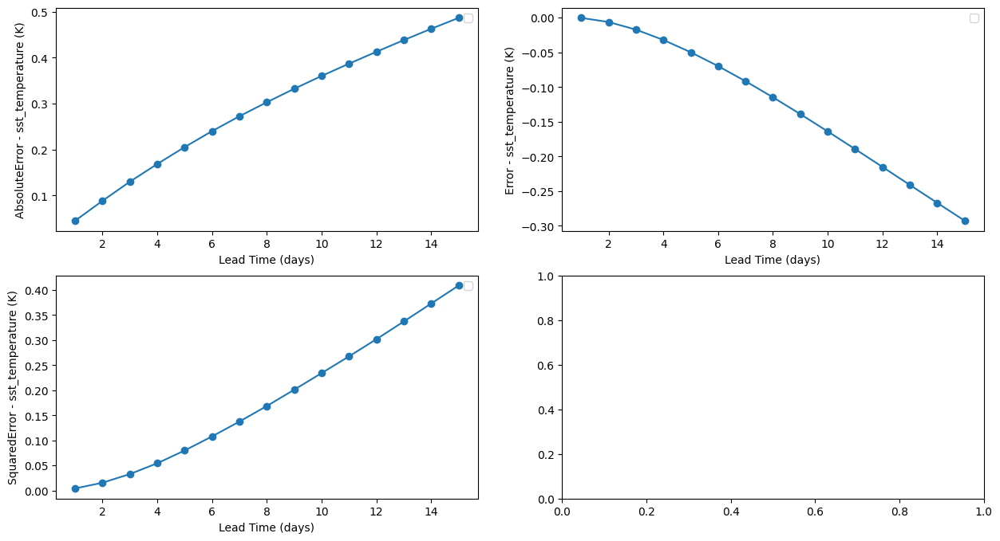

In [12]:
n_rows = int(np.ceil(np.sqrt(len(exp1.score_names))))
fig, axs = plt.subplots(n_rows, n_rows, figsize=(15, 8))
with StatsAggSession(exp1) as stats:
    # Plot lead time scores
    lead_time_scores = stats.agg_scores(['init_time', 'latitude', 'longitude'])
    axs = plot_lead_time_scores(axs, stats.score_names, stats.variable_names, lead_time_scores)

/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/702592498.py:86: FutureWarning: In a future version of xarray

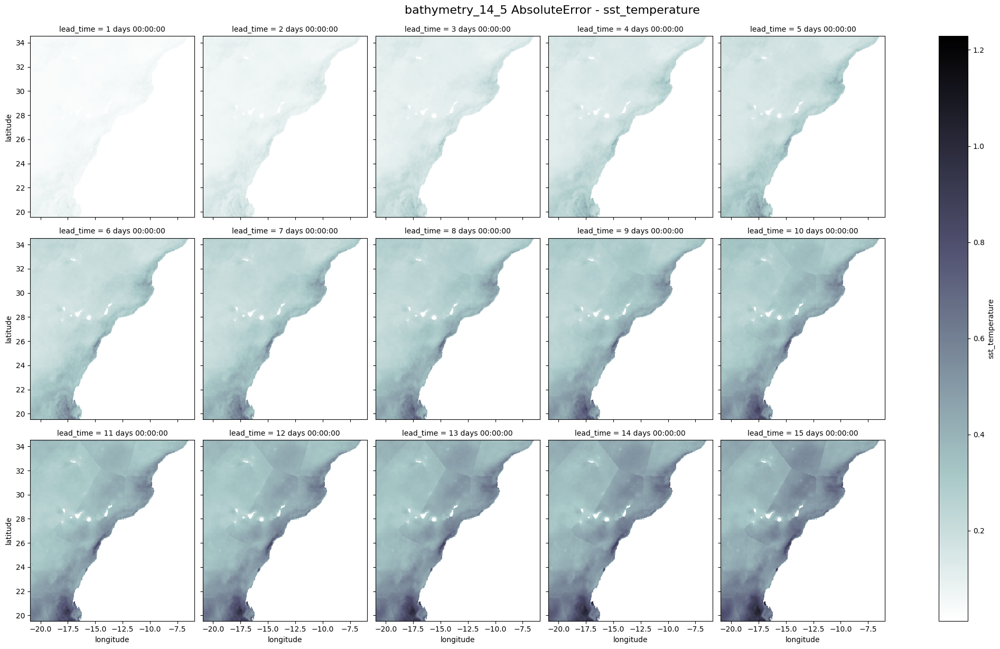

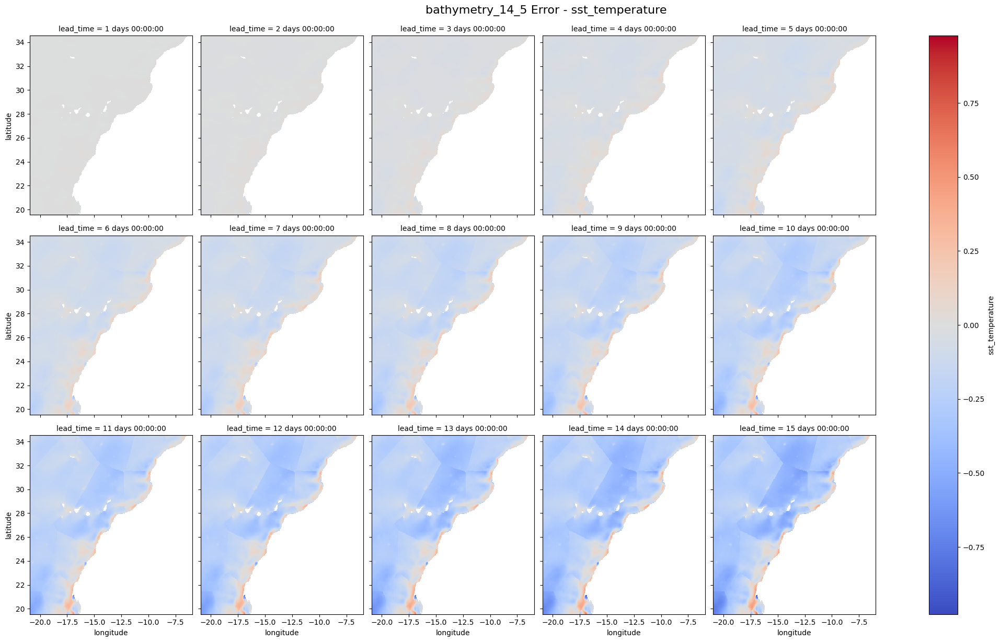

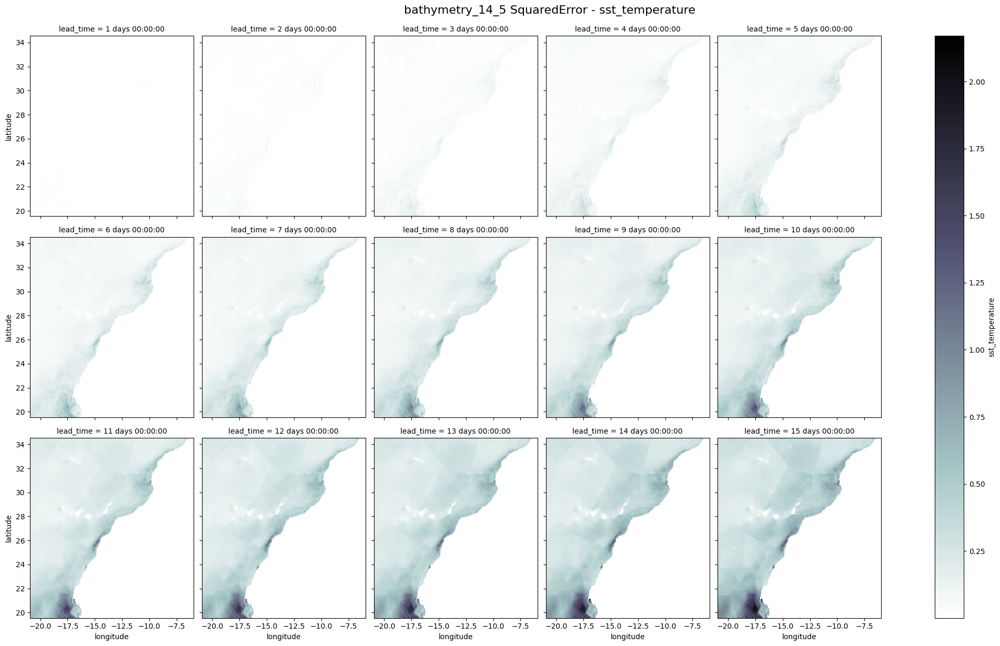

In [15]:
with StatsAggSession(exp1) as stats:
    for score in stats.score_names:
        plot_map_scores(
            exp_name=stats.exp_name,
            score_name=score,
            variable_names=stats.variable_names,
            map_scores=stats.agg_scores(['init_time']),
            cmap='coolwarm' if score == 'Error' else 'bone_r'
            )

# Functional approach
---

In [ ]:
def get_scores_and_variable_names(stats_dir: str) -> (set, set):
    """
    Get unique score names and variable names from the statistics directory.

    Args:
        stats_dir (str): Path to the directory containing statistics files.

    Returns:
        tuple: (set of score names, set of variable names)
    """
    scores = set()
    variables = set()
    for filename in os.listdir(stats_dir):
        if "_" in filename:
            score, var = filename.split('_', 1)
            var = var.replace('.nc', '')
            scores.add(score)
            variables.add(var)
    return scores, variables


In [ ]:
def load_statistics(stats_dir: Union[str, os.PathLike]) -> Dict[str, Dict[str, xr.Dataset]]:
    """
    Loads score NetCDF files from a directory and organizes the datasets
    into a nested dictionary: {score_name: {variable_name: Dataset}}.

    Parameters:
        stats_dir (str): Path to the directory containing the .nc score files.

    Returns:
        dict[str, dict[str, xarray.Dataset]]
    """
    statistics = defaultdict(dict)

    for filename in os.listdir(stats_dir):
        if filename.endswith(".nc"):
            name = filename.replace('.nc', '')  # Remove ".nc"
            # split into score and variable names
            score_name, variable_name = name.split('_', 1) 
            # Store current path
            filepath = os.path.join(stats_dir, filename)
            # Add the dataarray to the nested dictionary
            statistics[score_name][variable_name] = xr.load_dataarray(filepath)

    return dict(statistics)

In [43]:
HOME = os.path.expanduser("~")
stats_dir = os.path.join(HOME, "Seacast/output/bathymetry_14_5/statistics")
# Load statistics from the specified directory
statistics = load_statistics(stats_dir)

statistics

/tmp/ipykernel_3555453/928281484.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_3555453/928281484.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_3555453/928281484.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)


{'Error': {'sst_temperature': <xarray.DataArray 'sst_temperature' (init_time: 1080, lead_time: 15,
                                       latitude: 300, longitude: 300)> Size: 6GB
  array([[[[-1.32812500e-01, -1.79840088e-01, -1.40228271e-01, ...,
                        nan,             nan,             nan],
           [-9.99755859e-02, -1.54632568e-01, -1.21948242e-01, ...,
                        nan,             nan,             nan],
           [-9.44824219e-02, -1.43463135e-01, -1.31195068e-01, ...,
                        nan,             nan,             nan],
           ...,
           [ 3.70483398e-02,  2.01110840e-02,  1.53198242e-02, ...,
                        nan,             nan,             nan],
           [ 2.00195312e-02,  2.81066895e-02,  3.54003906e-02, ...,
                        nan,             nan,             nan],
           [ 2.22778320e-02,  1.85241699e-02,  2.57263184e-02, ...,
                        nan,             nan,             nan]],
  
        

In [44]:
# Define an aggregator to compute statistics
aggregator = aggregation.Aggregator(
  reduce_dims=["init_time"], skipna=True
)
# Agregate statistics
aggregation_state = aggregator.aggregate_statistics(statistics)
# Compute mean statistics
avr_stats = aggregation_state.mean_statistics()

avr_stats

{'Error': {'sst_temperature': <xarray.DataArray 'sst_temperature' (lead_time: 15, latitude: 300,
                                       longitude: 300)> Size: 5MB
  array([[[-0.00566559, -0.00542543, -0.00495916, ...,         nan,
                   nan,         nan],
          [-0.00569998, -0.00543679, -0.00457928, ...,         nan,
                   nan,         nan],
          [-0.00507852, -0.0045285 , -0.00410823, ...,         nan,
                   nan,         nan],
          ...,
          [-0.00240382, -0.0021201 , -0.00224027, ...,         nan,
                   nan,         nan],
          [-0.00188811, -0.00163721, -0.001872  , ...,         nan,
                   nan,         nan],
          [-0.00121776, -0.00106419, -0.0012309 , ...,         nan,
                   nan,         nan]],
  
         [[-0.03227093, -0.03184385, -0.03095989, ...,         nan,
                   nan,         nan],
          [-0.03265378, -0.03190666, -0.03051681, ...,         nan,
        

In [72]:
import numpy as np
np.ceil(np.sqrt(len(score_names)))

np.float64(2.0)

/tmp/ipykernel_3555453/3396318062.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()
/tmp/ipykernel_3555453/3396318062.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()
/tmp/ipykernel_3555453/3396318062.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


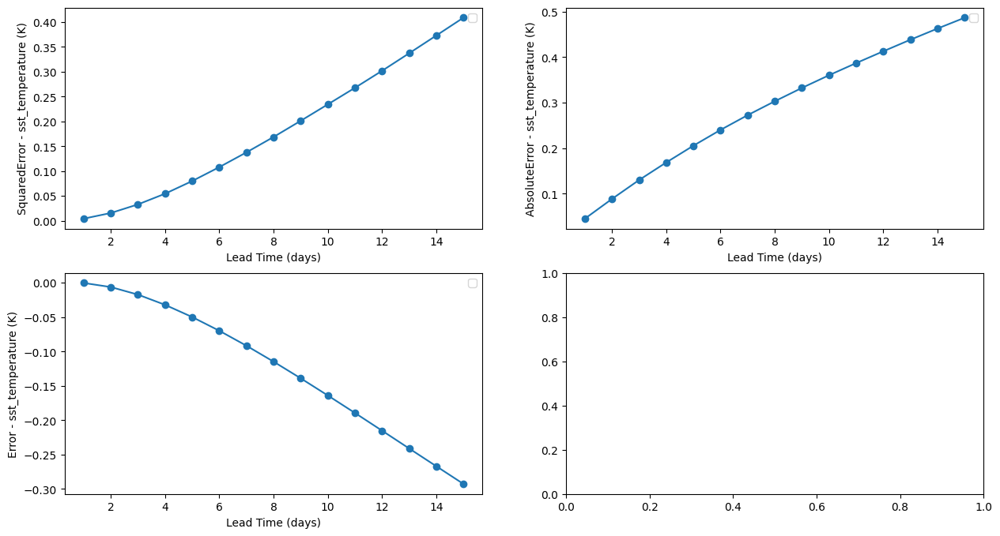

In [79]:
# Number of rows for the plot grid depending on the number of scores
n_rows = int(np.ceil(np.sqrt(len(score_names))))
fig, axs = plt.subplots(n_rows, n_rows, figsize=(15, 8))
axs = axs.flatten()
# Get unique score names and variable names
score_names, variable_names = get_scores_and_variable_names(stats_dir)
# Plot each score and variable in the grid
for ax, score in zip(axs, score_names):
     for variable in variable_names:
        data = avr_stats[score][variable].mean(
            dim=['latitude', 'longitude'], skipna=True
            )
        lead_days = data.lead_time.data.astype('timedelta64[D]')
        ax.plot(lead_days, data.data, marker='o', linestyle='-', label=f"")
        ax.set_xlabel("Lead Time (days)")
        ax.set_ylabel(f"{score} - {variable} (K)")
        ax.legend()
                

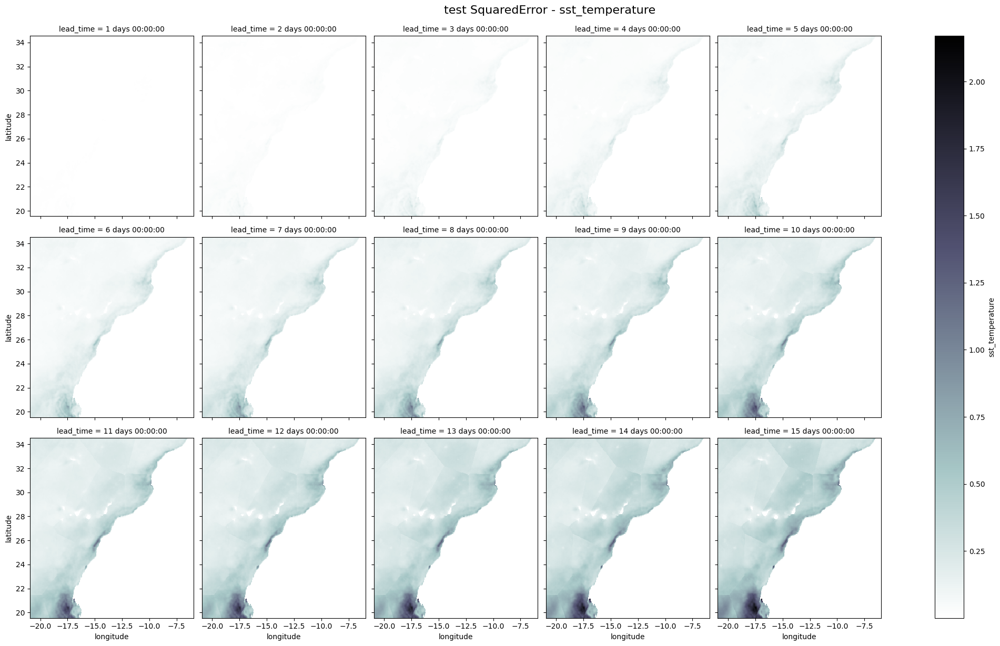

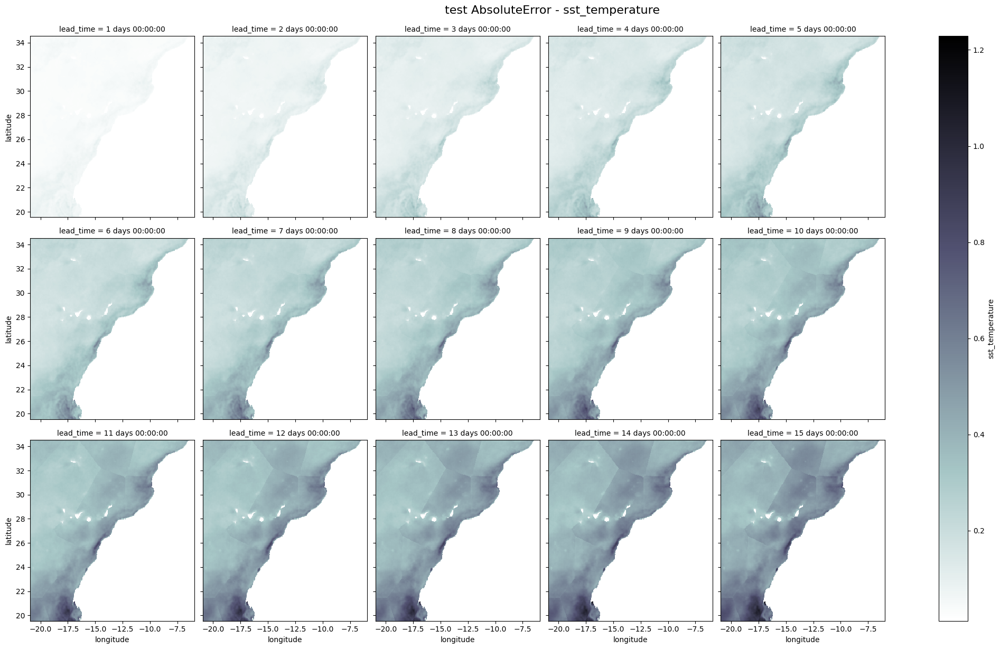

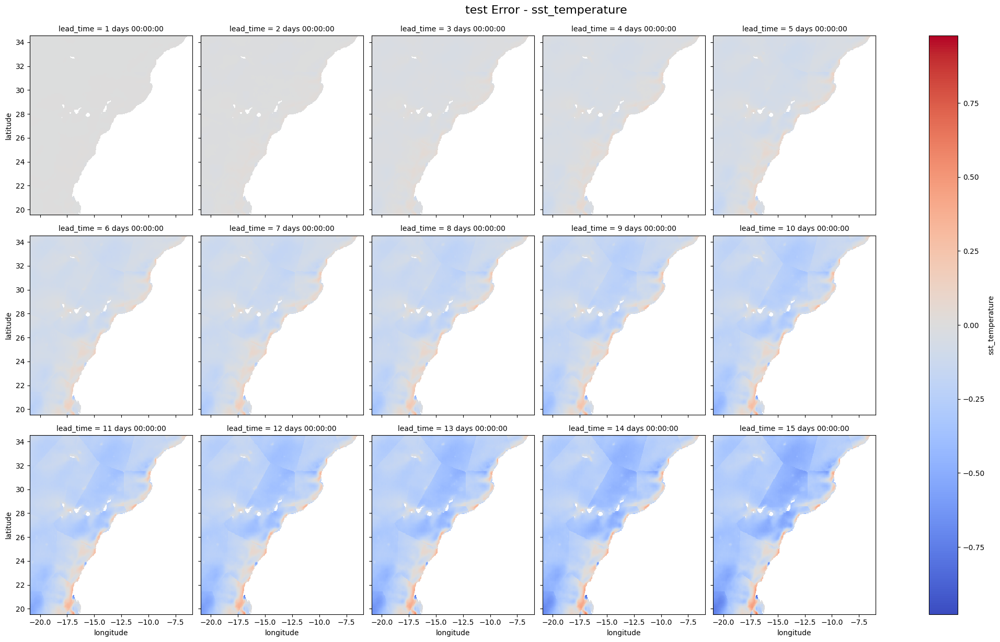

In [ ]:
for score in score_names:
    for variable in variable_names:
        avr_stats[score][variable].plot(
        x="longitude", 
        y="latitude", 
        col="lead_time", 
        cmap='coolwarm' if score == 'Error' else 'bone_r',
        col_wrap=5,
        aspect=1, 
        size=4,
        rasterized=True,
        )
        plt.suptitle(f"test {score} - {variable}", fontsize=16, y=1.02)


# Experiments comparison
---

In [21]:
experiments_names = [
    'bathymetry_m_14_6_g2mm2g_1',
    'bathymetry_m_14_6_g2mm2g_2',
    'bathymetry_m_14_6_g2mm2g_3',
    'bathymetry_m_14_6_g2mm2g_4',
    'bathymetry_m_14_6_g2mm2g_5',
    'bathymetry_m_14_6_g2mm2g_6',
    ]

experiments = [StatsLoader(os.path.join("~/Seacast/output", exp_name)) for exp_name in experiments_names]
experiments

[ExpStats(name=bathymetry_m_14_6_g2mm2g_1, stats_dir=/home/giovanny/Seacast/output/bathymetry_m_14_6_g2mm2g_1/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_2, stats_dir=/home/giovanny/Seacast/output/bathymetry_m_14_6_g2mm2g_2/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_3, stats_dir=/home/giovanny/Seacast/output/bathymetry_m_14_6_g2mm2g_3/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_4, stats_dir=/home/giovanny/Seacast/output/bathymetry_m_14_6_g2mm2g_4/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_5, stats_dir=/home/giovanny/Seacast/output/bathymetry_m_14_6_g2mm2g_5/statistics),
 ExpStats(name=bathymetry_m_14_6_g2mm2g_6, stats_dir=/home/giovanny/Seacast/output/bathymetry_m_14_6_g2mm2g_6/statistics)]

/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xa

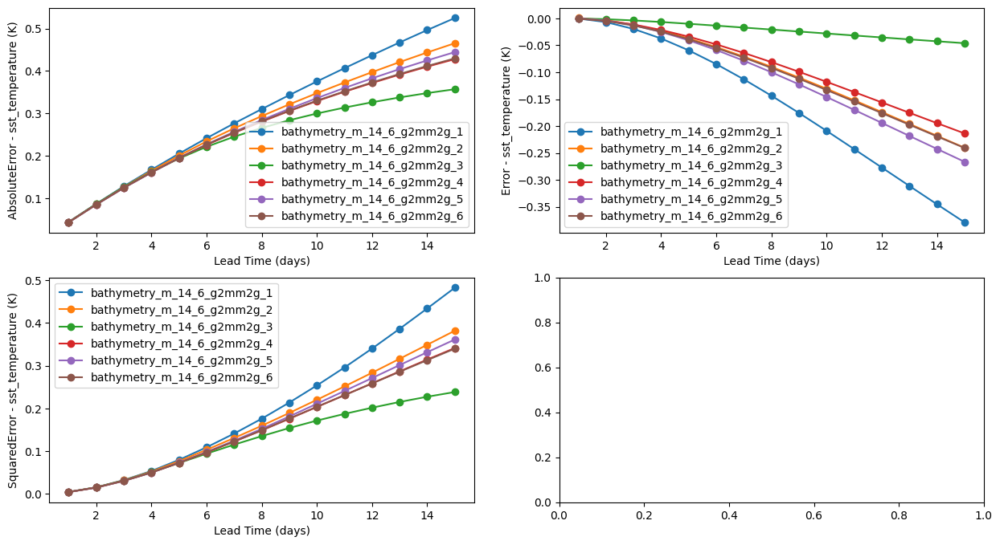

In [22]:
# Number of rows for the plot grid depending on the number of scores
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.flatten()
# Plot each score and variable in the grid
for exp in experiments:
    with StatsAggSession(exp) as stats:
        lead_time_scores = stats.agg_scores(
            ['init_time', 'latitude', 'longitude']
            )
        axs = plot_lead_time_scores(
            stats.exp_name, 
            stats.score_names, 
            stats.variable_names, 
            lead_time_scores, 
            axs
            )

/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xa

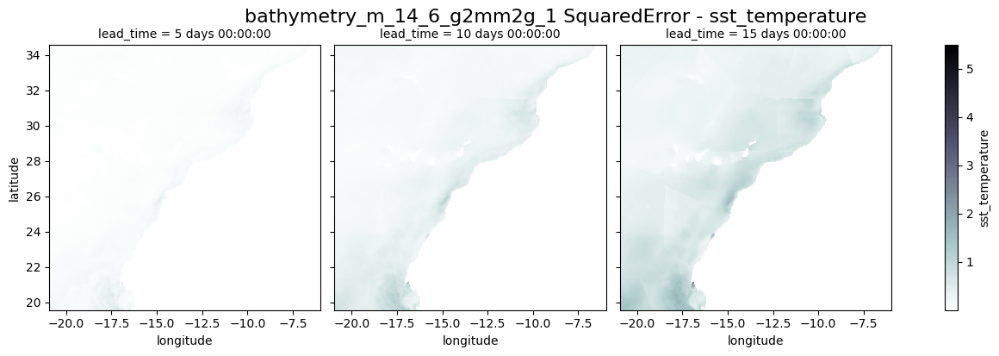

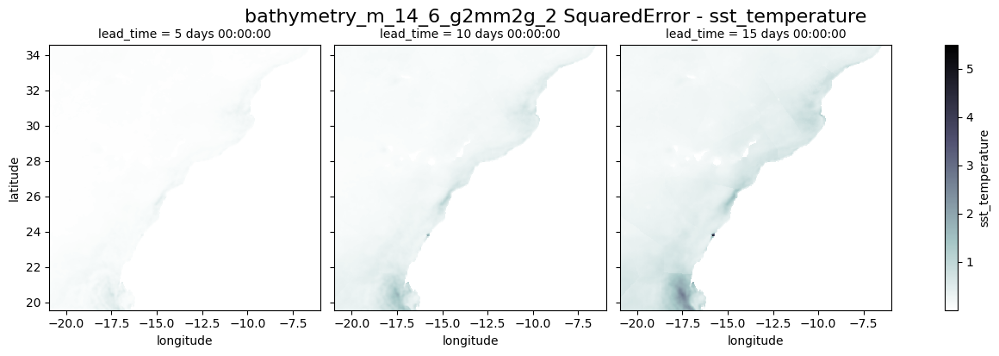

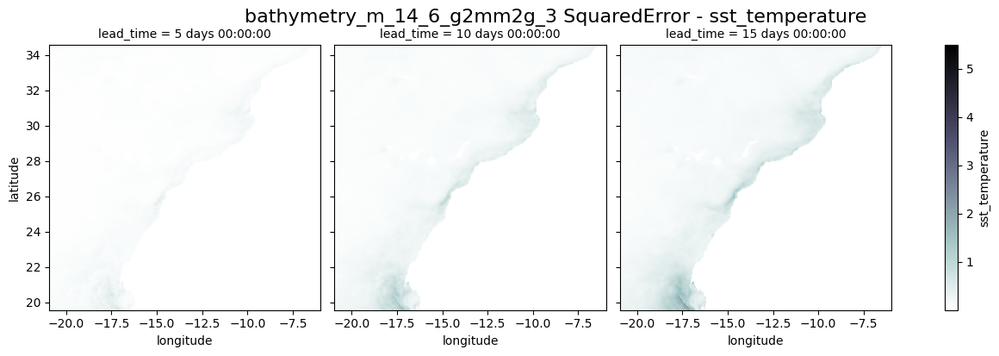

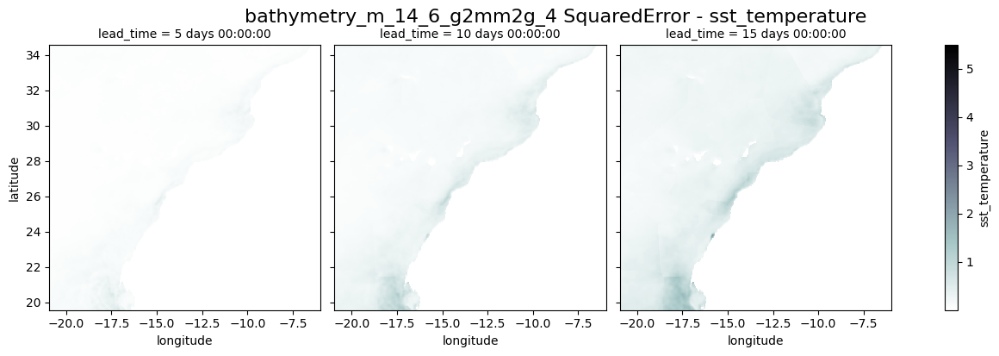

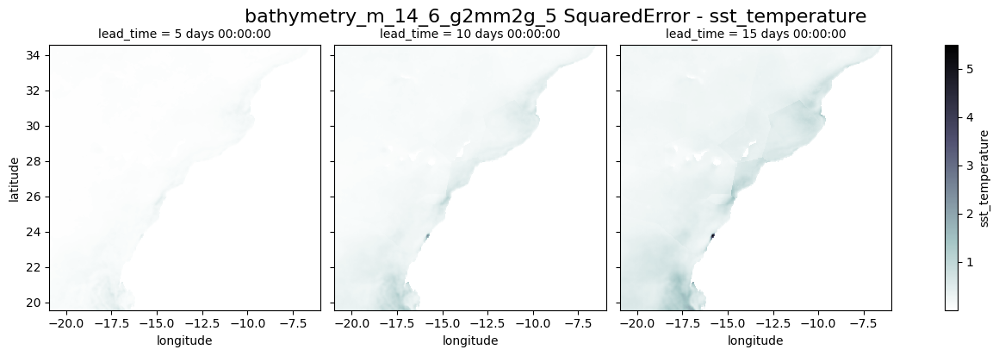

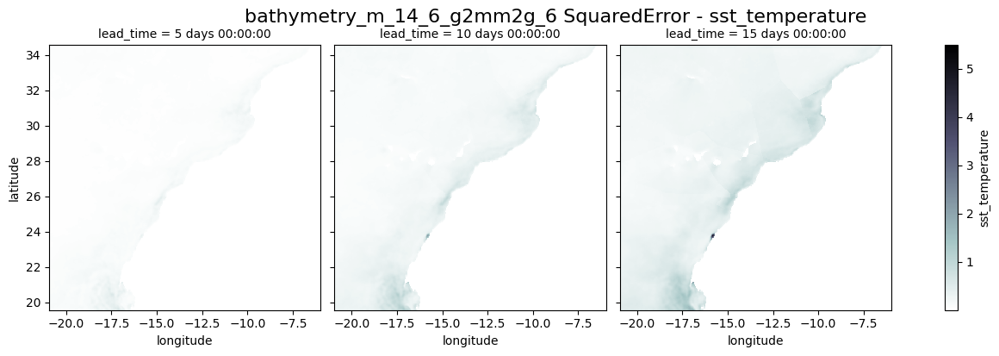

In [ ]:
# Parameters for the map scores
score = 'SquaredError'
var_name = 'sst_temperature'
lead_days = [4, 9, 14]  # Example lead times to filter

# Compute the minimum and maximum values for the map scores
vmin_exp = []
vmax_exp = [] 
for exp in experiments: 
    with StatsAggSession(exp) as stats:
        vmin_data, vmax_data = get_min_max(stats.agg_scores(['init_time']))
        vmin_exp.append(vmin_data[score][var_name])
        vmax_exp.append(vmax_data[score][var_name])

vmin = min(vmin_exp)
vmax = max(vmax_exp)

# Plot the map scores
for exp in experiments: 
    with StatsAggSession(exp) as stats:
        plot_map_scores(
            exp_name=stats.exp_name,
            score_name=score,
            variable_names=stats.variable_names,
            map_scores=filter_statistics(
                stats.agg_scores(['init_time']),
                dim_name='lead_time',
                filter_idx=lead_days,
                ),
            vmin=vmin,
            vmax=vmax,
            n_cols=3,
            cmap='coolwarm' if score == 'Error' else 'bone_r'
            )

/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xa

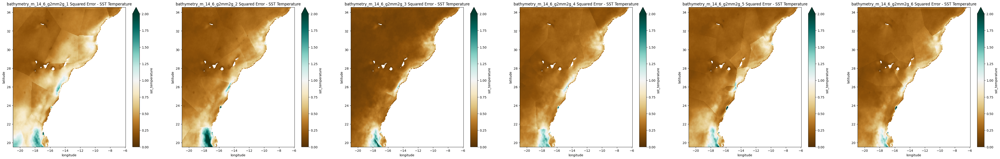

In [ ]:
# Parameters for the map scores
score = 'SquaredError'
var_name = 'sst_temperature'
lead_days = [14]  # Example lead times to filter

size = 8
n_exp = len(experiments)
fig, axs = plt.subplots(1, n_exp, figsize=(n_exp*size + size, size))
axs_f = axs.flatten() if hasattr(axs, 'flatten') else axs
vmin, vmax = 0.0, 2.0  # Ajusta según tu rango esperado de error
for ax, exp in zip(axs_f, experiments): 
    with StatsAggSession(exp) as stats:
        data = filter_statistics(
            stats.agg_scores(['init_time']),
            dim_name='lead_time',
            filter_idx=lead_days,
            )[score][var_name].squeeze()
            
        data.plot(
            x="longitude",
            y="latitude",
            cmap='BrBG',
            rasterized=True,
            ax=ax,
            vmin=vmin,
            vmax=vmax,
            )
        ax.set_title(f"{stats.exp_name} Squared Error - SST Temperature")

/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  statistics[score_name][variable_name] = xr.load_dataarray(filepath)
/tmp/ipykernel_51525/2764055685.py:86: FutureWarning: In a future version of xa

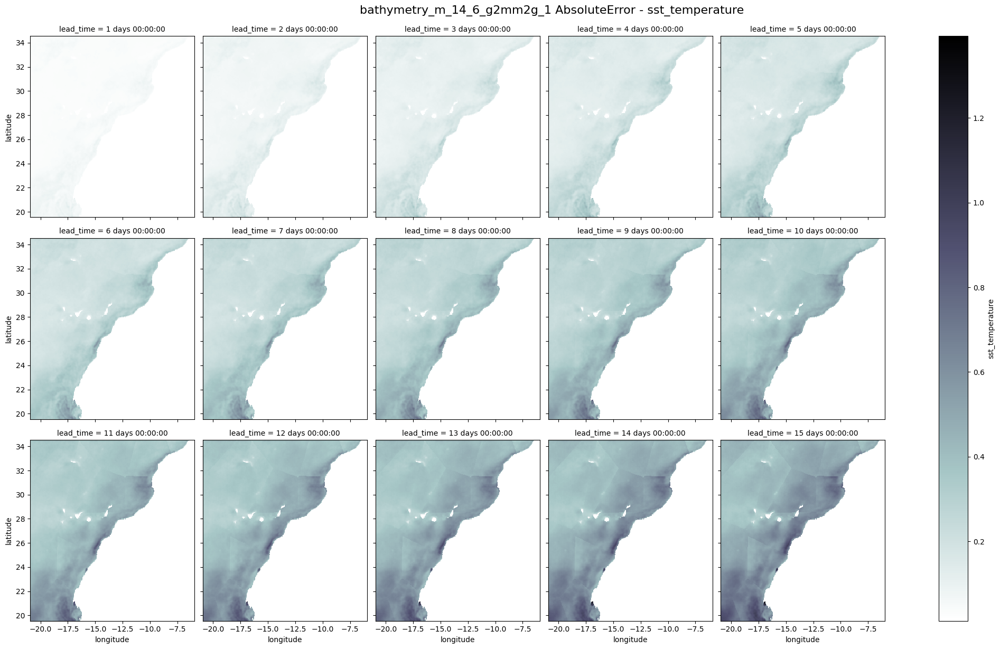

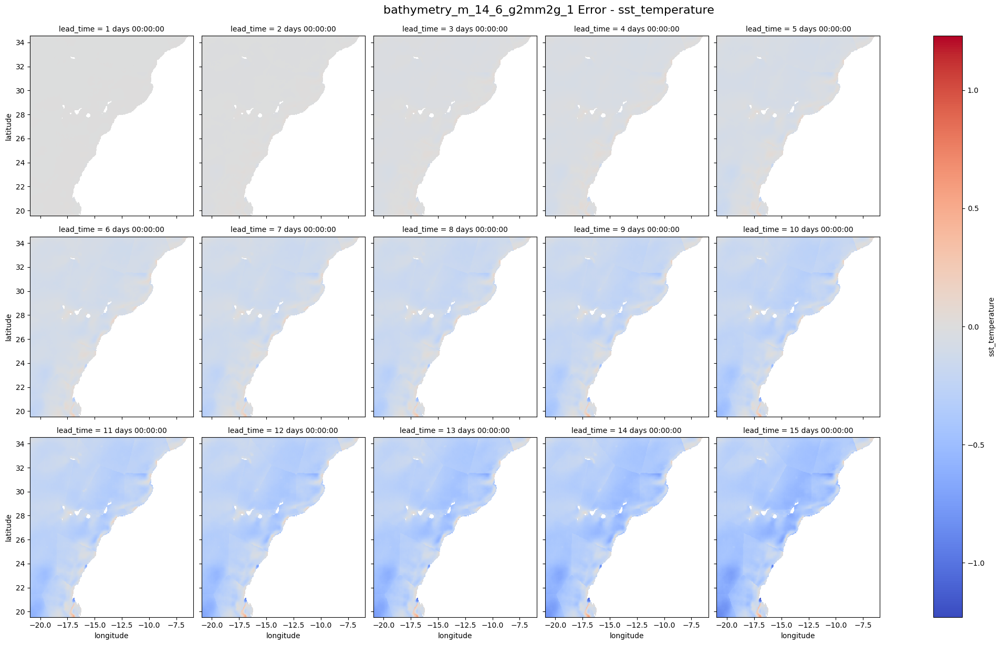

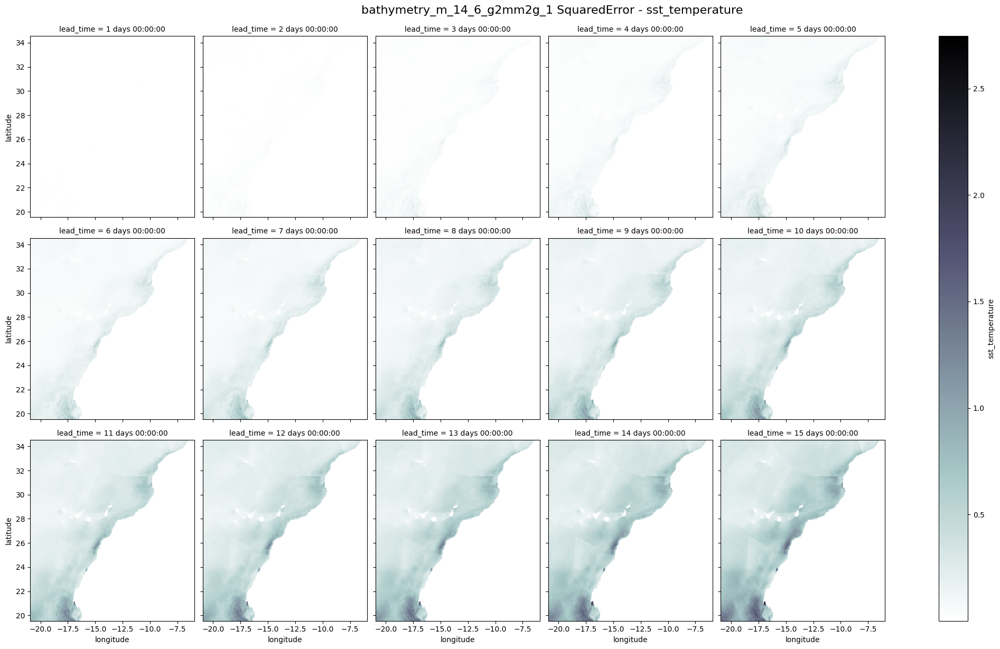

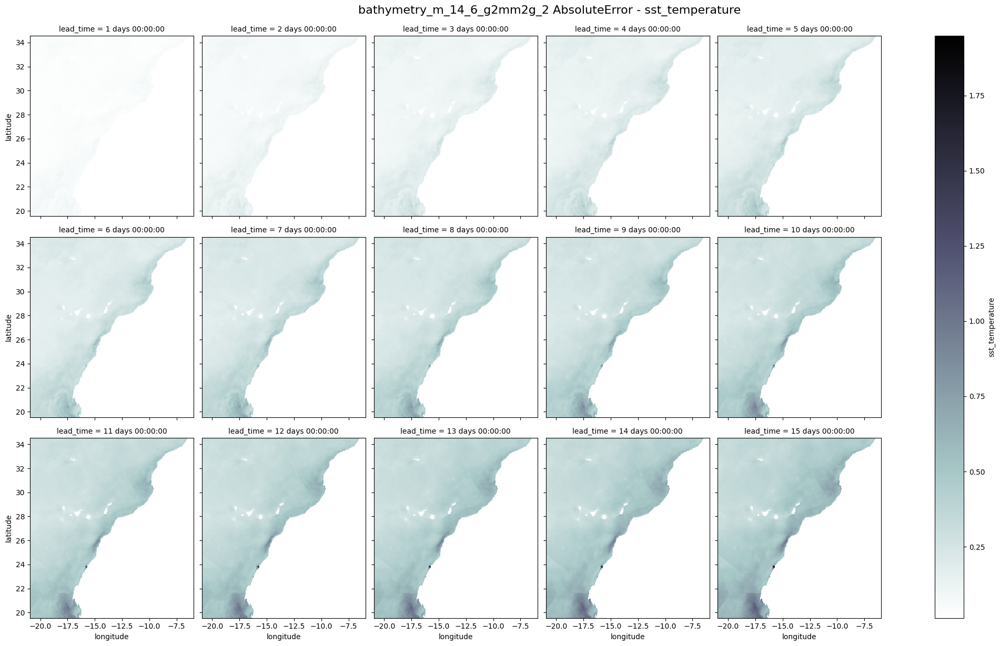

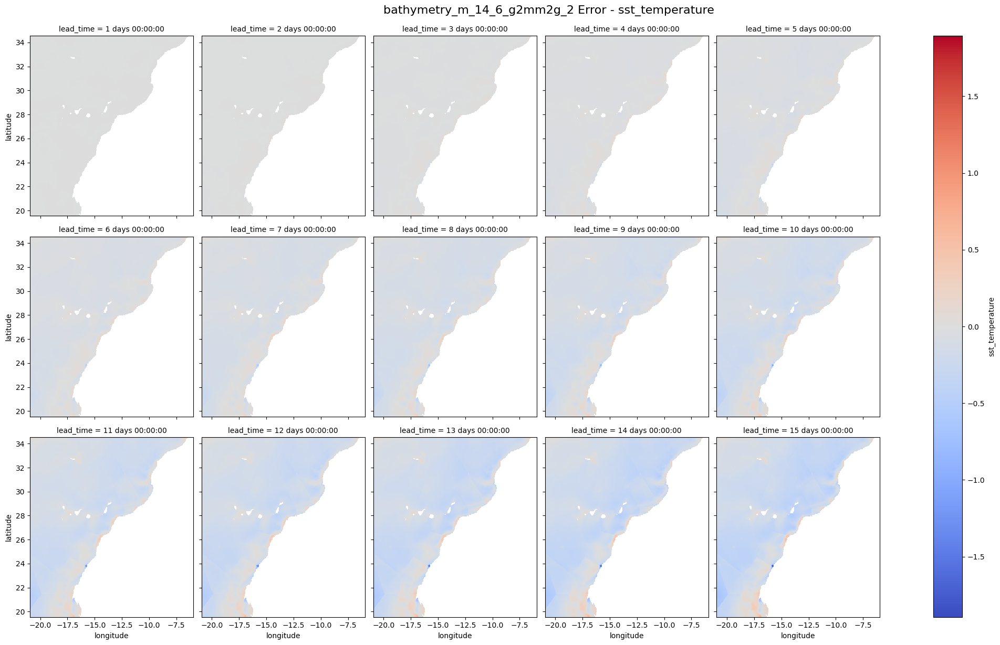

...

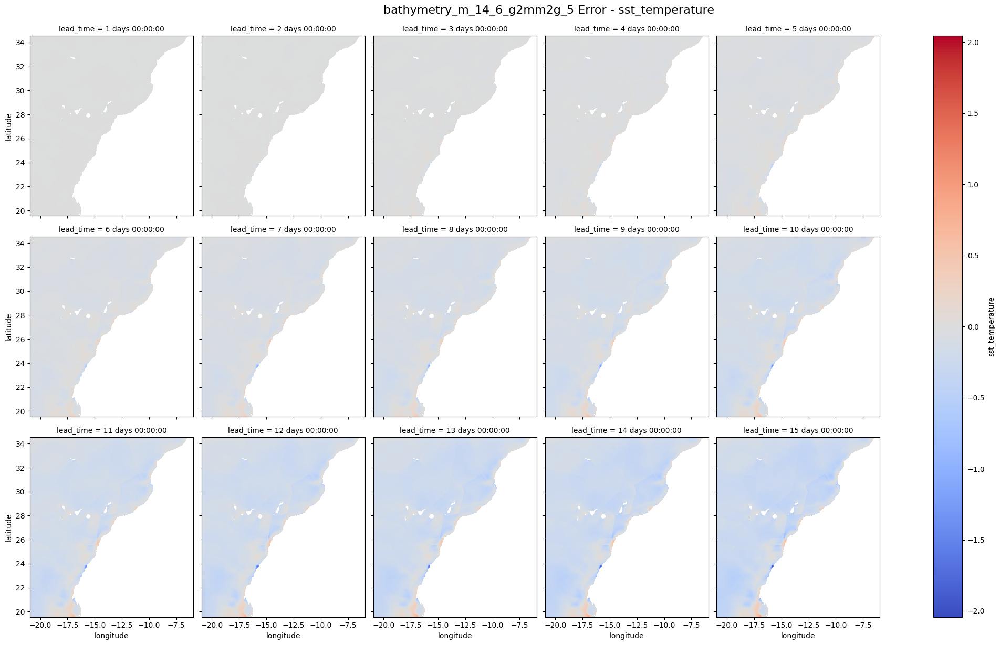

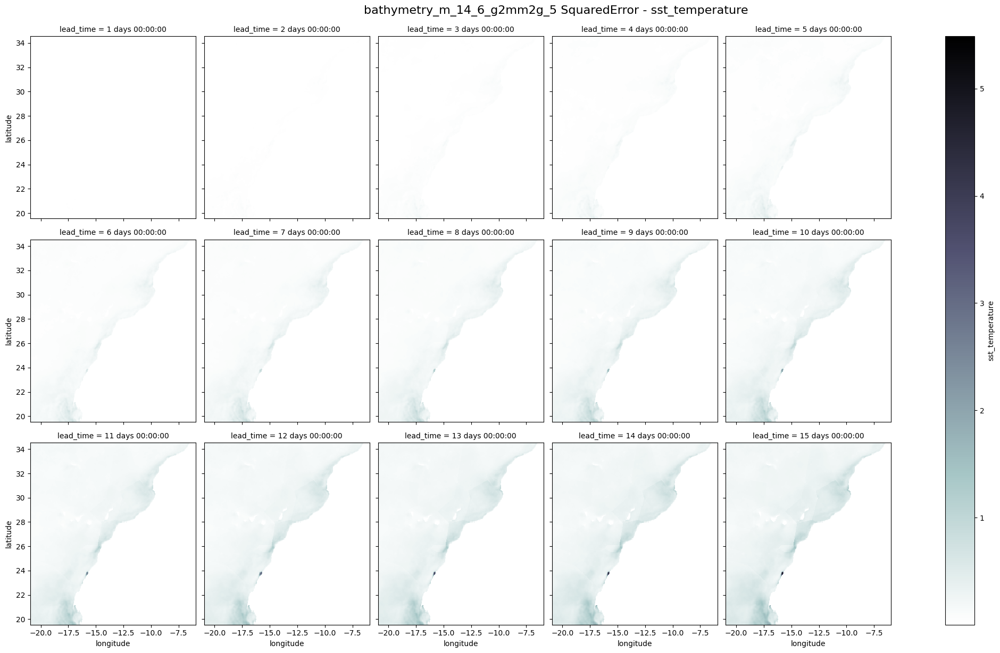

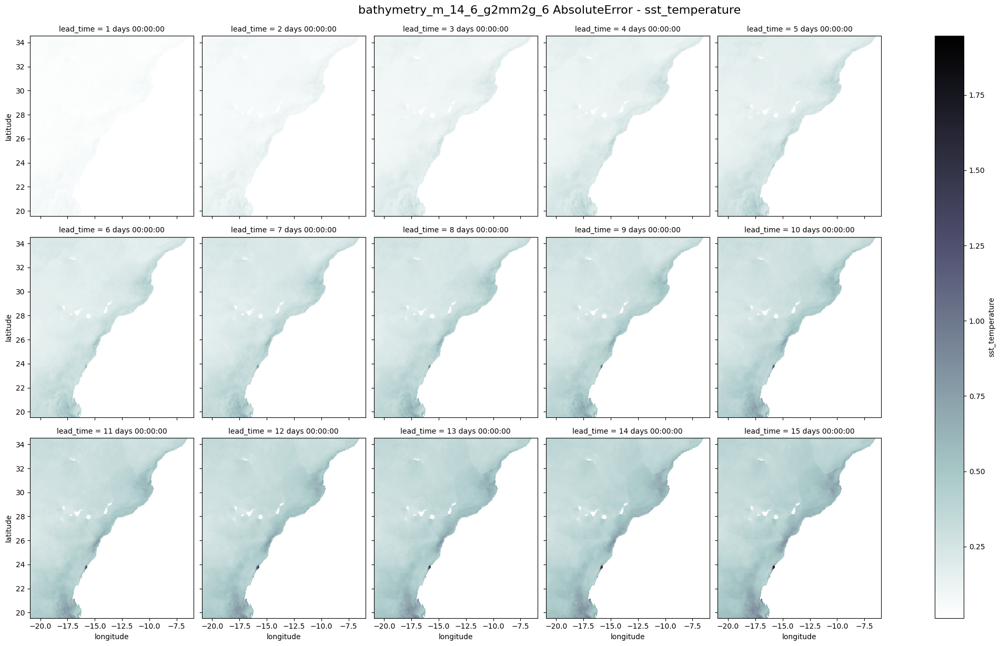

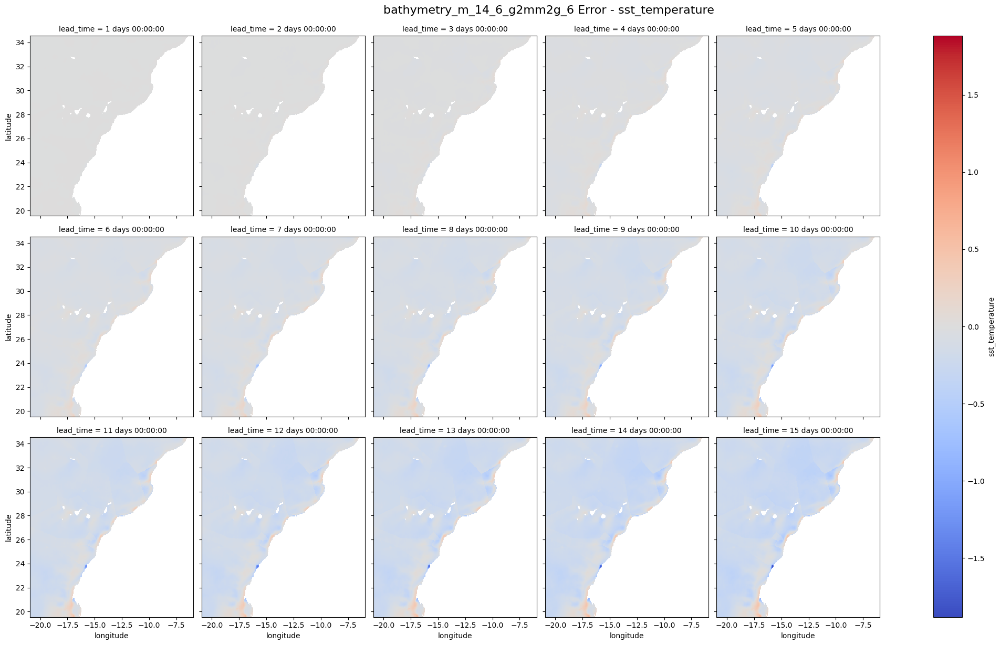

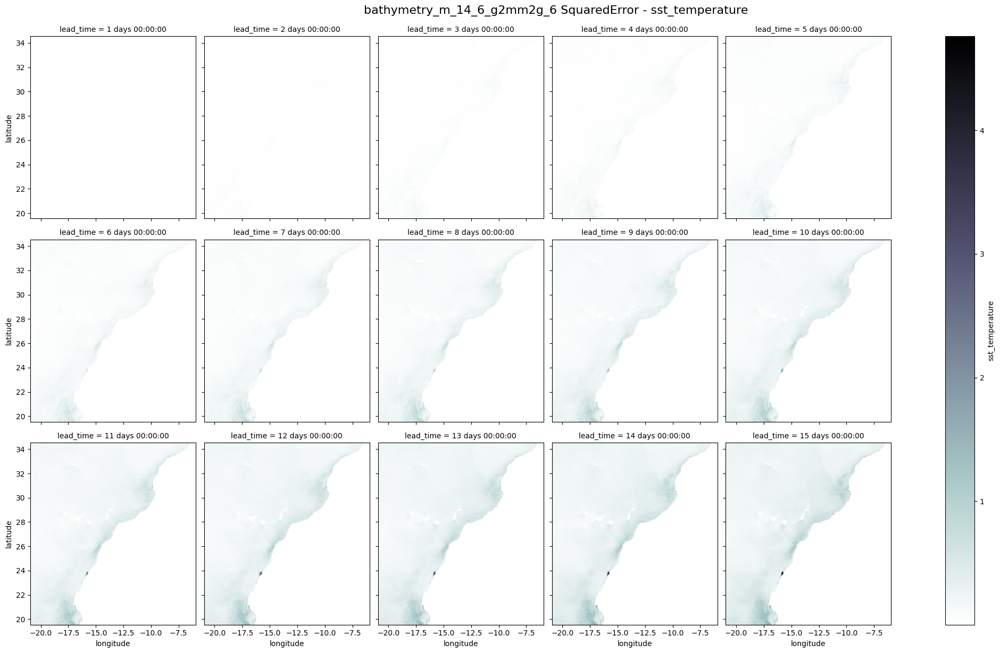

In [ ]:
for exp in experiments: 
    with StatsAggSession(exp) as stats:
        for score in stats.score_names:
            plot_map_scores(
                exp_name=stats.exp_name,
                score_name=score,
                variable_names=stats.variable_names,
                map_scores=stats.agg_scores(['init_time']),
                cmap='coolwarm' if score == 'Error' else 'bone_r'
                )